# TP ( Machine Learning 2 ): Classification de revenus 
                              
## Réalisé par : Hania Hachim, Elève Ingénieure Statisticienne Economiste 
## Sous la supervision de : Mme Mously Diaw, Data Scientist

# Summary
L'objectif est de construire un modèle de classification capable de prédire si une personne gagne plus ou moins de 50 000 dollars par an, en utilisant ses caractéristiques socio-démographiques.

Le jeu de données est "Adult Income" du UCI Machine Learning Repository.

UCIMLREPO package
Le package UCIMLRepo (pour UCI Machine Learning Repository) est une bibliothèque Python qui facilite l’accès aux jeux de données disponibles sur le célèbre dépôt UCI Machine Learning Repository. Il permet de chercher, télécharger et utiliser facilement ces datasets directement dans un notebook Python, sans avoir à passer par un téléchargement manuel.

# Packages

In [1]:
# Installation des dépendances
#!pip install dill imblearn pendulum ucimlrepo yellowbrick
#!pip install -U scikit-learn==1.3.2 imbalanced-learn==0.11.0
#!pip install loguru
#!pip install xgboost
#!pip install shap
#!pip install scipy


In [2]:
# Standard libraries
import logging
from pathlib import Path
import numpy as np
import pandas as pd
import scipy
import pendulum

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.graph_objects as go
import plotly.express as px
import shap
from yellowbrick.classifier import DiscriminationThreshold

# sklearn core
from sklearn import set_config
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    StratifiedKFold,
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    OrdinalEncoder,
    OneHotEncoder,
)
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
    auc,
    RocCurveDisplay,
    PrecisionRecallDisplay,
)

# XGBoost
from xgboost import XGBClassifier

# Imbalanced-learn
from imblearn.pipeline import Pipeline as imb_Pipeline

# UCIML Repo
from ucimlrepo import fetch_ucirepo, list_available_datasets

# Logger
from loguru import logger
# sauvegarde
import dill

# Configurations d'affichage
set_config(display='diagram')
pd.set_option("display.max_columns", None)


# Settings

In [3]:
EXECUTION_DATE = pendulum.now(tz="UTC")


ROOT_DIR = Path().cwd()
MODEL_DIR = Path(ROOT_DIR, "models")

MODEL_DIR.mkdir(parents=True, exist_ok=True)
logger.info(f"Model directory: {MODEL_DIR}")

2025-05-06 05:40:16.016 | INFO     | __main__:<module>:8 - Model directory: C:\Users\Hania\models


# Data collection

In [4]:
# check which datasets can be imported
list_available_datasets()

-------------------------------------
The following datasets are available:
-------------------------------------
Dataset Name                                                                            ID    
------------                                                                            --    
Abalone                                                                                 1     
Adult                                                                                   2     
Annealing                                                                               3     
Audiology (Standardized)                                                                8     
Auto MPG                                                                                9     
Automobile                                                                              10    
Balance Scale                                                                           12    
Balloons                       

In [5]:
# fetch dataset 
#Recuperer les donnees du package
adult = fetch_ucirepo(name="Adult", id=None) 

# fetch data
data = adult.data.original

logger.info(f"{data.shape}")

2025-05-06 05:40:29.457 | INFO     | __main__:<module>:8 - (48842, 15)


In [6]:
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [7]:
# metadata 
logger.info(f"Metadata \n {adult.metadata}") 
  
# variable information 
logger.info(f"Features: \n{adult.variables}") 
# resume du jeu de données 

2025-05-06 05:40:29.524 | INFO     | __main__:<module>:2 - Metadata 
 {'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': "Extraction was done by Barry Becker from the 1994 Census da

In [8]:
data.describe(include="all")
# on constate que income prend 4 valeurs au lieu de 2
#la librairie ppscore permet la selection des variables ou il faut tourner rapidement 
# un modele pour voir l importance des variables 

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
count,48842.000000,47879,4.884200e+04,48842,48842.000000,48842,47876,48842,48842,48842,48842.000000,48842.000000,48842.000000,48568,48842
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,4
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,33906,NaN,15784,NaN,22379,6172,19716,41762,32650,NaN,NaN,NaN,43832,24720
mean,38.643585,NaN,1.896641e+05,NaN,10.078089,NaN,NaN,NaN,NaN,NaN,1079.067626,87.502314,40.422382,NaN,NaN
std,13.710510,NaN,1.056040e+05,NaN,2.570973,NaN,NaN,NaN,NaN,NaN,7452.019058,403.004552,12.391444,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.175505e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.781445e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.376420e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [9]:
# Rename columns
data.columns = data.columns.str.replace("-", "_")
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education_num   48842 non-null  int64 
 5   marital_status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital_gain    48842 non-null  int64 
 11  capital_loss    48842 non-null  int64 
 12  hours_per_week  48842 non-null  int64 
 13  native_country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


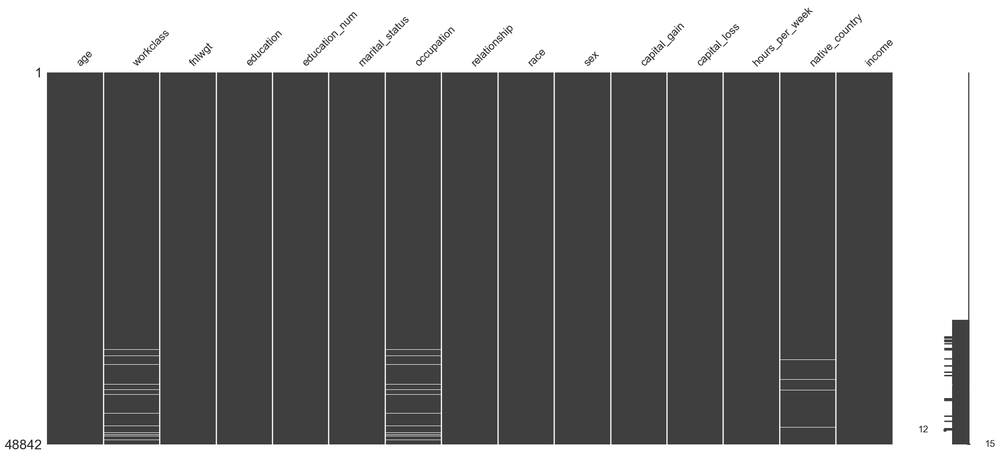

In [11]:
msno.matrix(data);
# Pratiquement toutes les variables n ont aucun NA sauF 3 

# EDA: Exploratory Data Analysis

In [12]:
data["income"].value_counts(normalize=False)
# 50K est la valeur majoritaire 
# valeurs similaires mais légèrement différentes en raison de la présence d'un point final

income
<=50K     24720
<=50K.    12435
>50K       7841
>50K.      3846
Name: count, dtype: int64

### Target

In [13]:
# correction pour avoir deux valeurs : replace by empty thing
data = data.assign(income= lambda dfr: dfr.income.str.replace(".", ""))

In [14]:
label_distribution = data.groupby(['income']).size().reset_index(name='count')
label_distribution

,income,count
0,<=50K,37155
1,>50K,11687


In [15]:
# Plot a pie chart with custom colors for income
fig = px.pie(
    label_distribution, 
    names='income',  # Use 'income' for pie segments
    values='count',  # Use 'count' for the size of each pie slice
    # color='income',  # Color the segments based on income
    title='Income distribution',
    labels={'income': 'Income', 'count': 'Count'},
)

fig.update_traces(textinfo='percent+label')  # Display percentage and labels on the pie chart

fig.show()

## Categorical features

In [16]:

categorical_columns = data.select_dtypes(include="object").columns

categorical_columns

Index(['workclass', 'education', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'native_country', 'income'],
      dtype='object')

In [17]:
for col_name in categorical_columns:
    logger.info(f"{col_name} ==============\n {data[col_name].value_counts(dropna=False)}\n")
  

2025-05-06 05:40:34.352 | INFO     | __main__:<module>:2 - workclass ==============
 workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
?                    1836
Self-emp-inc         1695
Federal-gov          1432
NaN                   963
Without-pay            21
Never-worked           10
Name: count, dtype: int64

2025-05-06 05:40:34.362 | INFO     | __main__:<module>:2 - education ==============
 education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

2025-05-06 05:40:34.362 | INFO     | __main__:<module>:2 - marital_status ==============
 marital_status
Married-civ-spouse       22379
Never-ma

Résumé des actions possibles :
Remplacer les ? et NaN dans les variables catégorielles.

Imputer ou supprimer les données manquantes selon la situation.

Re-grouper ou supprimer les catégories peu fréquentes comme Never-worked et Without-pay.

Utiliser One-Hot Encoding ou Label Encoding pour transformer les variables catégorielles avant de passer à l'entraînement du modèle.

### Preprocessing

In [18]:
# après les analyses on a beaucoup plus de valeurs manquantes 
# il faut également faire la suppression des doublons 
# Replace “?” with None for all columns containing it
data.replace("?", None, inplace=True)

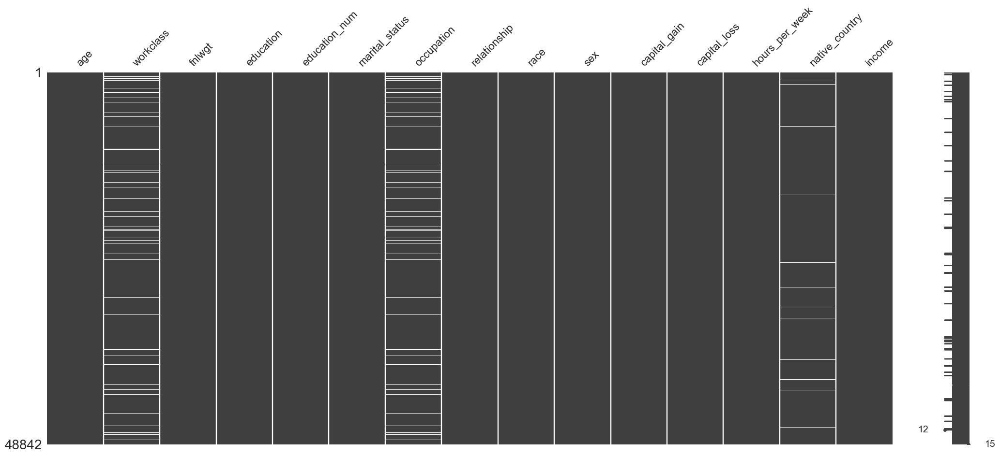

In [19]:
msno.matrix(data);

### Remove Duplicated

In [20]:
# Shape after deduplication
#Pour ce dataset comme on a pas d'ID alors si on a les mêmes observations alors il y a doublons 
data.shape

(48842, 15)

In [21]:
# Check for the duplicates: if True then there are duplicated
data.duplicated().any()

True

In [22]:
data[data.duplicated(keep=False)].sort_values(["workclass", "education", "relationship"])

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
24667,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
36713,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
5842,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
22300,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38993,22,NaN,334593,Some-college,10,Never-married,NaN,Not-in-family,White,Male,0,0,40,United-States,<=50K
10094,19,None,167428,Some-college,10,Never-married,None,Own-child,White,Male,0,0,40,United-States,<=50K
30384,20,None,203353,Some-college,10,Never-married,None,Own-child,White,Female,0,0,40,United-States,<=50K
34424,20,NaN,203353,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,40,United-States,<=50K


In [23]:
# Drop duplicates
data = data.drop_duplicates(keep='first', inplace=False)
data.shape

(48790, 15)

In [24]:
# Shape after deduplication
data.shape

(48790, 15)

## Numerical features

In [25]:
#on calcule le differentiel : permet de reduire la dimensionnalaté du modele 
# pour analyser le comportement des captaux en terme de capital gagné et perdu 
data["capital_diff"] = data['capital_gain'] - data['capital_loss']

In [26]:
#
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

In [27]:
# Initialize a figure
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in numeric_columns:
    fig.add_trace(go.Box(
        y=data[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns without Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()

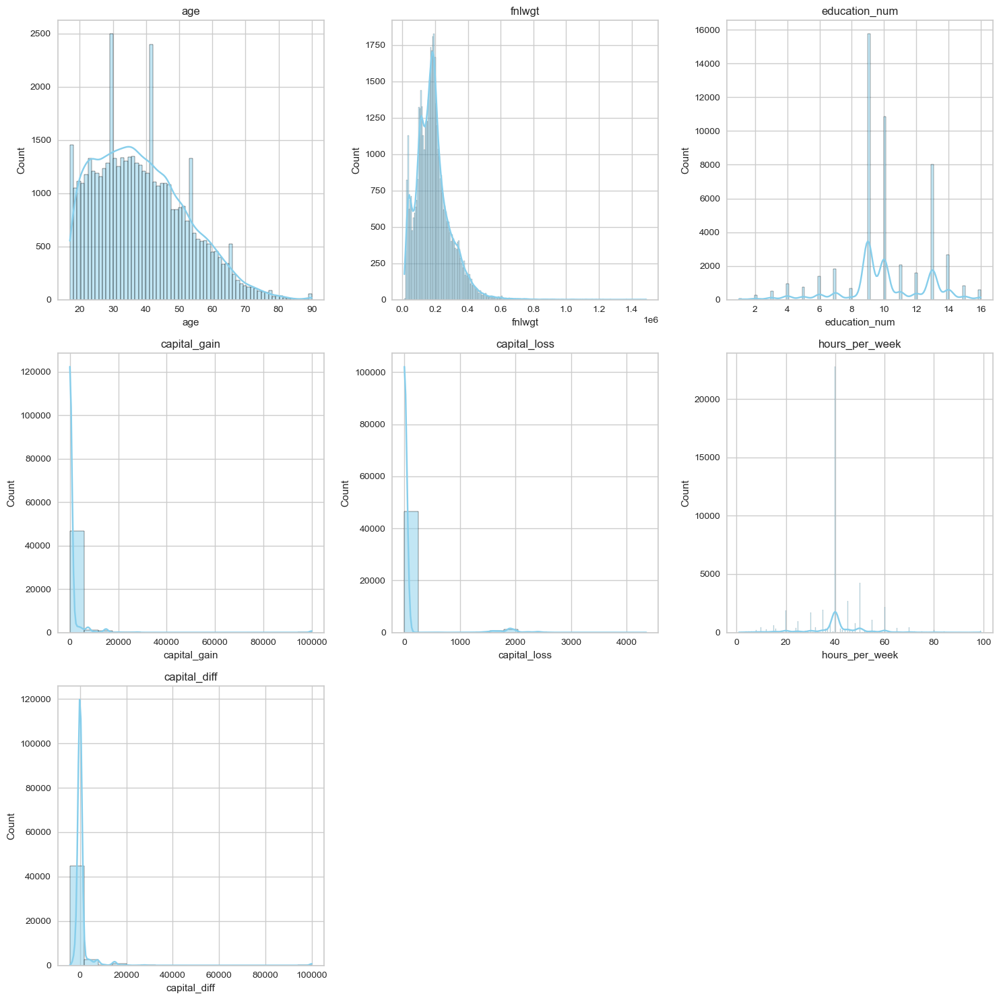

In [28]:
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col_name in enumerate(numeric_columns):
    sns.histplot(data[col_name], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(col_name)
    
for i in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


## Bivariate analysis

In [29]:
px.box(
    data,
    x='income',  # Income category on the x-axis
    y='age',  # Age distribution on the y-axis
    title='Age Distribution by Income',
    labels={'income': 'Income Category', 'age': 'Age'}
)

In [30]:
data

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K,0
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,<=50K,0
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K,0
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K,5455


In [31]:
for col_name in ["workclass",
                 "education",
                 "marital_status",
                 "sex"
                ]:

    feature_income_counts = data.groupby([col_name, 'income']).size().unstack()
    
    fig = px.bar(feature_income_counts,
                 barmode='stack',  # Stack bars for income categories
                 title=f'Relationship between Income and {col_name}',
                 labels={'value': 'Count'}
                )
    fig.show()

In [32]:
for col_name in numeric_columns:

    #counts
    num_feat_income_counts = data.groupby([col_name, "income"]).size().unstack()
    
    # Plot using iplot
    fig = px.area(num_feat_income_counts,
                  title=f"Relationship between {col_name} and income",
                  labels={"value": "Count"}
                 )
    fig.show()

C:\Users\Hania\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



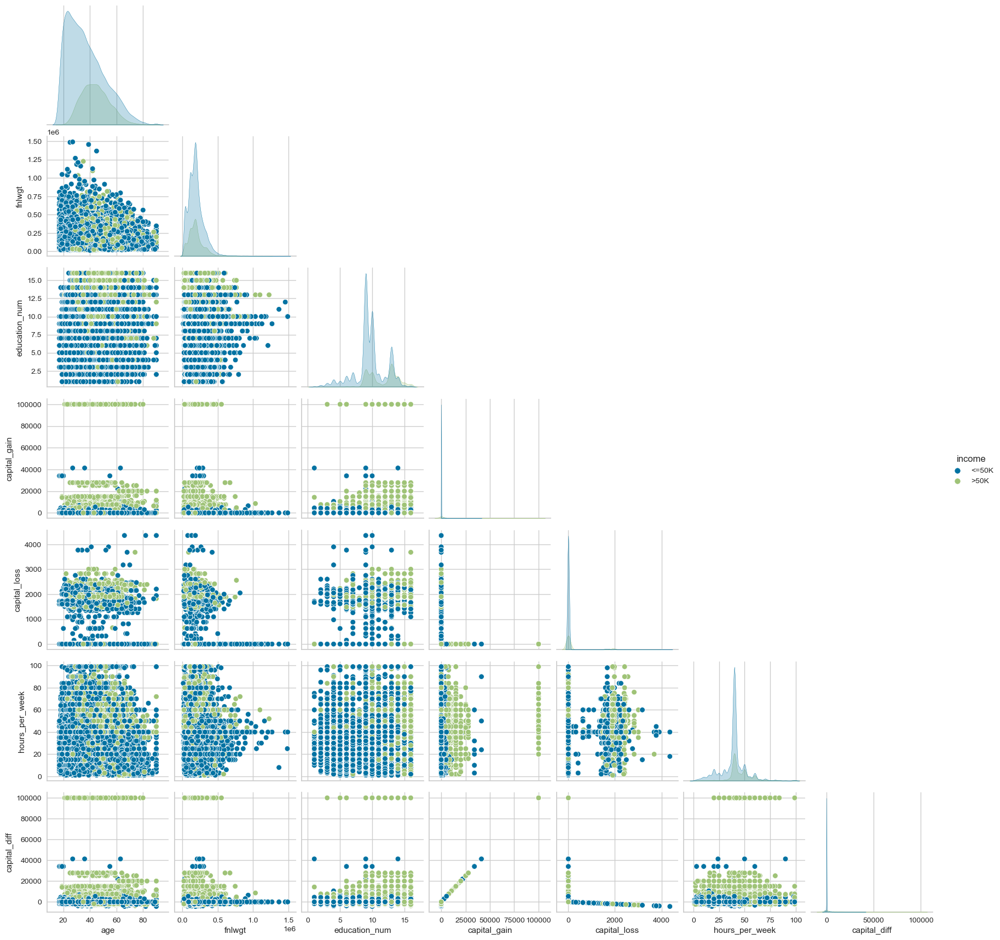

In [33]:
sns.pairplot(data, hue="income", corner=True);

### Correlation

In [34]:
corr_matrix = data.loc[:, numeric_columns].corr()

In [35]:
data.loc[:, numeric_columns].corr()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,capital_diff
age,1.000000,-0.076451,0.030635,0.077185,0.056838,0.071223,0.073878
fnlwgt,-0.076451,1.000000,-0.038727,-0.003715,-0.004378,-0.013521,-0.003467
education_num,0.030635,-0.038727,1.000000,0.125219,0.080986,0.143915,0.120459
capital_gain,0.077185,-0.003715,0.125219,1.000000,-0.031475,0.082152,0.998547
capital_loss,0.056838,-0.004378,0.080986,-0.031475,1.000000,0.054431,-0.085285
hours_per_week,0.071223,-0.013521,0.143915,0.082152,0.054431,1.000000,0.078959
capital_diff,0.073878,-0.003467,0.120459,0.998547,-0.085285,0.078959,1.000000


<Axes: >

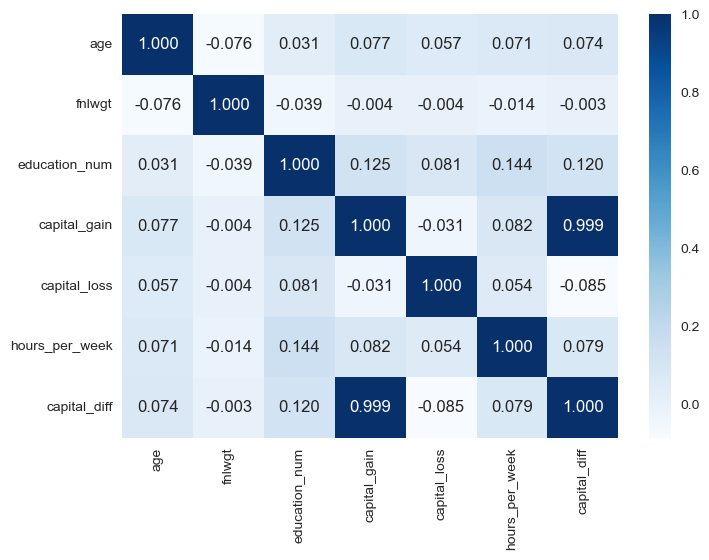

In [36]:
sns.heatmap(corr_matrix, annot=True, fmt=".3f", cmap="Blues")

# Data preparation

In [37]:
data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


In [38]:
# Removing rows where 'Workclass' is 'Without-pay' and 'Never-worked'
data = data[~data["workclass"].str.lower().isin(["without-pay", "never-worked"])
            # & data["hours_per_week"].between(20, 60)
           ]
data.shape

(48759, 16)

In [39]:
data["hours_per_week"].value_counts(sort=False).sort_index()

hours_per_week
1      27
2      53
3      59
4      83
5      95
     ... 
95      2
96      9
97      2
98     14
99    137
Name: count, Length: 96, dtype: int64

In [40]:
#Feature mapping
workclass_mapping = {
    'Private': 'Private',
    'Self-emp-not-inc': 'Self-Employed',
    'Local-gov': 'Government',
    'State-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Federal-gov': 'Government',
    'Without-pay': 'Other',
    'Never-worked': 'Other'
}

marital_status_mapping = {
    "Married-civ-spouse": "Married",
    "Married-spouse-absent": "Married",
    "Married-AF-spouse": "Married",
    "Separated": "Married",
    "Never-married": "Single",
    "Divorced": "Single",
    "Widowed": "Single"
}

relationship_mapping = {
    'Husband': 'spouse',
    'Not-in-family': 'Others:',
    'Own-child': 'Immediate Family',
    'Unmarried': 'Others:',
    'Wife': 'spouse',
    'Other-relative': 'Immediate Family',
}

# occupation
# occupation_mapping = to be defined if necessary

In [41]:
data = data.assign(income=lambda dfr: dfr['income'].map({"<=50K": 0, ">50K": 1}),
                   # capital_diff_bin = lambda dfr: pd.cut(dfr['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
                   native_country=lambda dfr: dfr["native_country"].fillna("United-States").map(lambda val: val if val == "United-States" else "Others"),
                   education=lambda dfr: dfr.education.replace(["11th", "9th", "7th-8th", "5th-6th", "10th", "1st-4th", "12th"], "School"),
                   race=lambda dfr: dfr.race.map(lambda val: 'White' if val == 'White' else 'Others'),
                   # workclass=lambda dfr: dfr.workclass.map(workclass_mapping),
                   # marital_status=lambda dfr: dfr.marital_status.map(marital_status_mapping),
                   # relationship=lambda dfr: dfr.relationship.map(relationship_mapping),
                  )

# Train / test split

In [42]:
data.drop(['capital_gain',# on supprime les deux car sinon il y aura redondance avec capital diff
           'capital_loss',
           "fnlwgt",  # fnlwgt (Final Weight): Represents the weight assigned to each individual. Si on prend un nouvel individu on ne sait pas quel poids on va lui imputer.C'est donc une variable qui n'est pas toujours disponible 
           
           "education_num", # il y aura redondance avec la variable education 
       ], axis=1, inplace=True)  
      

Certaines colonnes comme capital_gain, capital_loss, fnlwgt et education_num sont supprimées du jeu de données, car elles présentent des problèmes de redondance ou ne sont pas toujours disponibles pour de nouveaux individus.

In [104]:
x_values = data.drop(columns=['income'])  
y_target = data.income

In [44]:
x_train, x_test, y_train, y_test = train_test_split(x_values, y_target, test_size=0.2, random_state=42, stratify=y_target)

stratify=y_target assure que la proportion de classes (<=50K et >50K) reste la même dans les ensembles d'entraînement et de test.

In [45]:
x_train.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,hours_per_week,native_country,capital_diff
44101,35,Local-gov,Bachelors,Married-civ-spouse,Protective-serv,Husband,White,Male,48,United-States,0
36845,61,Private,HS-grad,Divorced,Machine-op-inspct,Not-in-family,White,Female,40,United-States,0
44706,41,Private,Some-college,Divorced,Sales,Unmarried,White,Male,46,United-States,0
35127,49,Self-emp-not-inc,School,Married-civ-spouse,Farming-fishing,Husband,White,Male,50,United-States,0
41678,37,Self-emp-not-inc,Assoc-voc,Married-civ-spouse,Farming-fishing,Husband,White,Male,60,United-States,0


In [46]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

# Feature engineering

In [47]:
x_values.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,hours_per_week,native_country,capital_diff
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States,2174
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States,0
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States,0
3,53,Private,School,Married-civ-spouse,Handlers-cleaners,Husband,Others,Male,40,United-States,0
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Others,Female,40,Others,0


In [48]:
# numerical
numeric_features = x_values.select_dtypes(include="number").columns

# categorical : on applique le one hot encoding 
onehot_features = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'marital_status']

country_feature = ["native_country"]
ordinal_features = ['education',
                   # 'capital_diff_bin',
                  ]
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [49]:
x_train.loc[:, numeric_features]

,age,hours_per_week,capital_diff
44101,35,48,0
36845,61,40,0
44706,41,46,0
35127,49,50,0
41678,37,60,0
...,...,...,...
2324,63,50,0
30520,21,40,0
42196,60,25,0
41858,34,40,0


In [50]:

#1. Imputation : Remplace les valeurs manquantes des variables numériques par la médiane de la colonne.
#Mise à l'échelle (Scaling) : Applique un StandardScaler,qui standardise les données pour avoir une moyenne de 0 
#et un écart type de 1. Cela est utile pour des modèles sensibles aux échelles des données.

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


# Education : ordinal + imputation 'undefined' gérée via catégorie manquante
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('ordinal', OrdinalEncoder(categories=[cat_for_edu + ['undefined']], handle_unknown='use_encoded_value', unknown_value=-1))
])

# OneHot : autres variables catégorielles avec imputation "undefined"
onehot_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Native country : imputation avec "United-States"
country_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='United-States')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Pipeline
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('ord', ordinal_transformer, ordinal_features),
    ('cat', onehot_transformer, onehot_features),
    ('country', country_transformer, country_feature)
])



NOTE : Les variables numériques sont imputées par la médiane et mises à l'échelle.
Les variables ordinales sont imputées et encodées avec des valeurs ordonnées.
Les variables catégorielles sont imputées (undefined) et encodées via One-Hot Encoding.
La variable native_country est imputée (United-States) et encodée également via One-Hot Encoding.
Le tout est intégré dans un pipeline global (ColumnTransformer) pour appliquer ces transformations aux différentes colonnes de de données.

# Modeling

### Dummy regressor

In [51]:
# Pipeline
dm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', DummyClassifier())
])

dm_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', DummyClassifier())])

In [52]:
# Training
dm_pipeline.fit(x_train, y_train)

# Predictions & evaluation
dm_y_pred_test = dm_pipeline.predict(x_test)
dm_y_proba_test = dm_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, dm_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, dm_y_pred_test)}")

2025-05-06 05:43:59.330 | INFO     | __main__:<module>:9 - AUC: 0.50
C:\Users\Hania\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Hania\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Hania\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

2025-05-06 05:43:59.361 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

      

## Logistic regression

In [53]:
# Pipeline
rl_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', LogisticRegression(max_iter=1000))
])

rl_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', LogisticRegression(max_iter=1000))])

### Baseline

In [54]:
# 8. Entraînement
rl_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
rl_y_pred_test = rl_pipeline.predict(x_test)
rl_y_proba_test = rl_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rl_y_proba_test):.2f} ")

logger.info(f"Classification report: \n{classification_report(y_test, rl_y_pred_test)}")

2025-05-06 05:44:02.257 | INFO     | __main__:<module>:9 - AUC: 0.90 
2025-05-06 05:44:02.292 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      7416
           1       0.72      0.59      0.65      2336

    accuracy                           0.85      9752
   macro avg       0.80      0.76      0.78      9752
weighted avg       0.84      0.85      0.84      9752



weighted : ponderation de la classe positive 


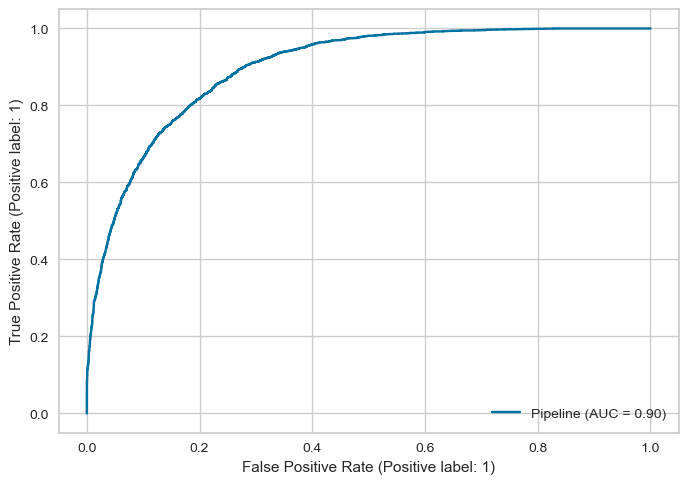

In [55]:
RocCurveDisplay.from_estimator(rl_pipeline, x_test, y_test);

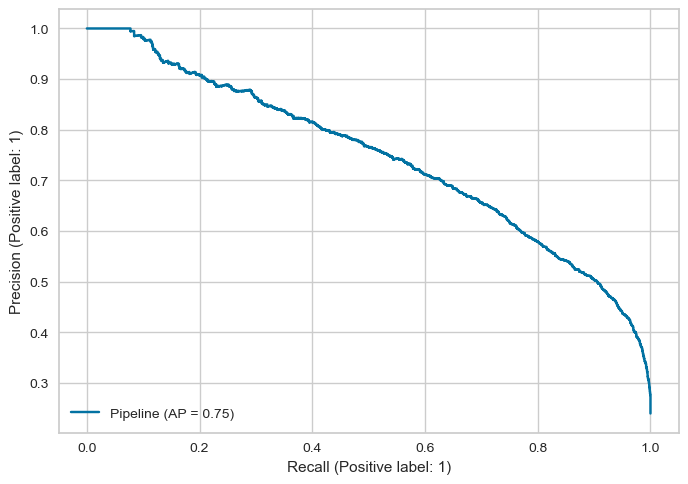

In [56]:
PrecisionRecallDisplay.from_estimator(rl_pipeline, x_test, y_test);

### Optimisation des hyperparamètres 

In [57]:
rl_param_grid = {
    "clf__penalty": ["l2"],  # 'l1' si solver = 'liblinear' ou 'saga'
    "clf__C": [0.01, 0.1, 1, 2, 3, 5, 10],
    "clf__solver": ['liblinear', 'lbfgs', "sag", "saga"],  # lbfgs ne supporte que l2
    "clf__class_weight": ['balanced', None],  # le class weight sert à ne pas penaliser les classes minoritaires en leur donnant un poids beaucoup plus important 
    # cela permet de penaliser les erreurs sur les classes minoritaires bcp plus que sur les classes majoritaires 
}# selon le type de penalité que l'on va utiliser
# on ne peut pas utiliser tous les solveurs 
# pour initialiser aller sur scikit learn et taper logistic regression 
# sur kaggle les gens proposent des astuces 

In [58]:
# Cross-validation
cv = StratifiedKFold(n_splits=5) 

rl_grid_search = GridSearchCV(rl_pipeline, rl_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

# Training
rl_grid_search.fit(x_train, y_train)

# Best params
logger.info(f"Best params : {rl_grid_search.best_params_}")

# Evaluation
rl_y_pred_test_opt = rl_grid_search.predict(x_test)
rl_y_proba_test_opt  = rl_grid_search.predict_proba(x_test)[:, 1]

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")

2025-05-06 05:49:58.768 | INFO     | __main__:<module>:10 - Best params : {'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'sag'}
2025-05-06 05:49:58.906 | INFO     | __main__:<module>:16 - AUC : 0.90
2025-05-06 05:49:58.927 | INFO     | __main__:<module>:17 - F1-score : 0.66
2025-05-06 05:49:58.931 | INFO     | __main__:<module>:18 - Accuracy : 0.79


### Discrimination threshold

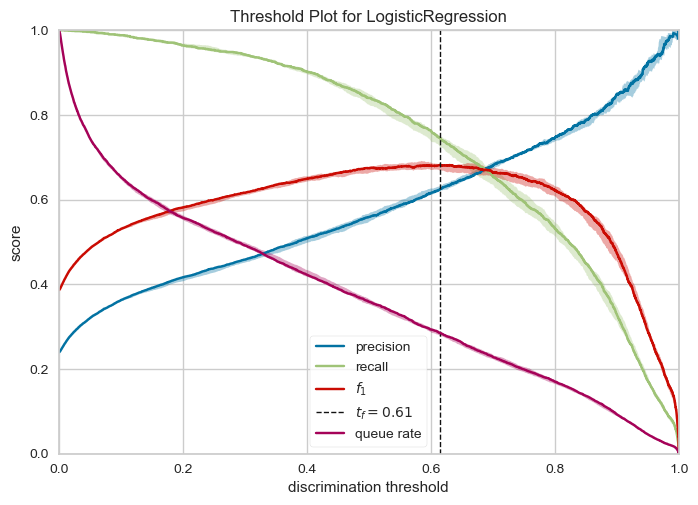

In [59]:
viz = DiscriminationThreshold(rl_grid_search.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")
# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [60]:
#préparer les données pour l’analyse de la courbe de lift, en triant les échantillons selon leurs probabilités prédites, 
#en les divisant en déciles, et en calculant des agrégats comme le taux de positifs global.
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": rl_y_pred_test_opt, "proba": rl_y_proba_test_opt}) 
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()
# Decile
data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()# features importances
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum","count"]) 

In [61]:
#calcule le lift pour chaque décile,c’est-à-dire l’efficacité du modèle pour identifier les échantillons pertinents, 
#trace une courbe de lift qui montre comment le modèle se comporte à travers les différentes portions de l’échantillon.

lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

In [62]:
#Evaluation au seuil de 0,61 
# Evaluation avec seuil 0.61
rl_y_proba_test_opt = rl_grid_search.predict_proba(x_test)[:, 1]
rl_y_pred_test_opt = (rl_y_proba_test_opt >= 0.61).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")



2025-05-06 06:04:51.335 | INFO     | __main__:<module>:6 - AUC : 0.90
2025-05-06 06:04:51.349 | INFO     | __main__:<module>:7 - F1-score : 0.68
2025-05-06 06:04:51.352 | INFO     | __main__:<module>:8 - Accuracy : 0.83


In [63]:
# definition de dataframe pour les comparaisons 
lg_results = {
    "Modèle": "Régression Logistique (optimisé + seuil)",
    "Seuil optimal": 0.61,
    "F1-score":f1_score(y_test, rl_y_pred_test_opt) ,
    "AUC": roc_auc_score(y_test, rl_y_proba_test_opt),
    "Accuracy": accuracy_score(y_test, rl_y_pred_test_opt)
}


In [64]:
print(classification_report(y_test, rl_y_pred_test_opt))


              precision    recall  f1-score   support

           0       0.92      0.85      0.88      7416
           1       0.62      0.75      0.68      2336

    accuracy                           0.83      9752
   macro avg       0.77      0.80      0.78      9752
weighted avg       0.85      0.83      0.83      9752



In [65]:
#Save model
# Save model

model_path_name = Path(MODEL_DIR, "best_logistic_model.dill")

logger.info(f"Model path name: {model_path_name}")
with open(model_path_name, "wb") as fp:
    dill.dump(rl_grid_search.best_estimator_, fp) 

2025-05-06 06:04:51.461 | INFO     | __main__:<module>:6 - Model path name: C:\Users\Hania\models\best_logistic_model.dill


# KNN

### Baseline

In [66]:
# Pipeline
knn_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

knn_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', KNeighborsClassifier(n_neighbors=10))])

In [67]:
# 8. Entraînement
knn_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
knn_y_pred_test = knn_pipeline.predict(x_test)
knn_y_proba_test = knn_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, knn_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, knn_y_pred_test)}")


2025-05-06 06:06:15.827 | INFO     | __main__:<module>:9 - AUC: 0.88
2025-05-06 06:06:15.892 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      7416
           1       0.72      0.56      0.63      2336

    accuracy                           0.84      9752
   macro avg       0.80      0.74      0.76      9752
weighted avg       0.83      0.84      0.84      9752



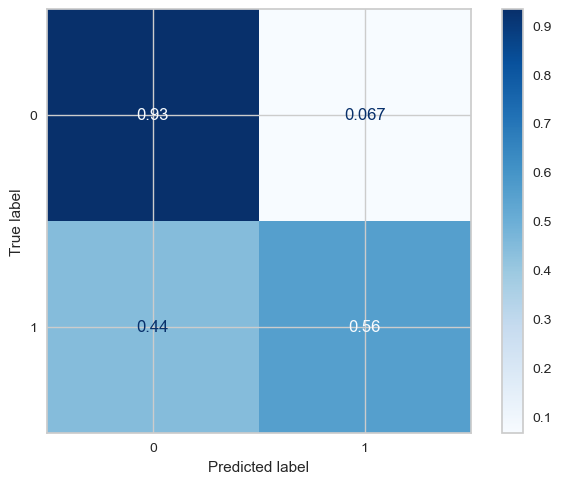

In [68]:
class_names=np.unique(y_test)
class_names=knn_pipeline.classes_
class_names
ConfusionMatrixDisplay.from_estimator(knn_pipeline, x_test, y_test,
                                      display_labels=class_names,
                                      normalize="true", cmap=plt.cm.Blues);

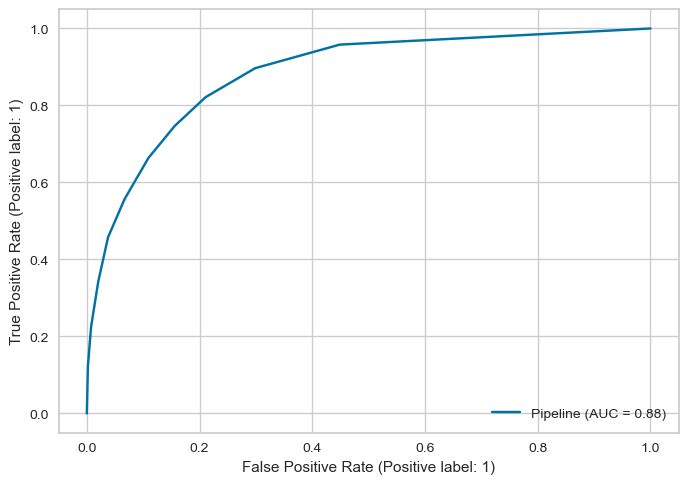

In [69]:
RocCurveDisplay.from_estimator(knn_pipeline, x_test, y_test);

### Optimisation des hyperparamètres pour KNN 

In [70]:
knn_param_grid={
    "clf__n_neighbors":[5,10,15,20,30],
    "clf__weights":["uniform","distance"],
    "clf__p": [1,2]
}

In [71]:
knn_grid_search = GridSearchCV(knn_pipeline, knn_param_grid, cv=cv, scoring="roc_auc", n_jobs=-1)

knn_grid_search.fit(x_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=91, shuffle=False),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleI...
                                                                        ('country',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        KNeighborsClassifier(n_neighbors=10))]),
             n_jobs=-1,
             param_grid={'clf__n_neighbors': [5, 10, 15, 20, 30],
                         'clf__p': [1, 2],
                         'clf__weights': ['uniform', 'distance']},
             scoring='roc_auc')

In [72]:
knn_y_pred_test_opt = knn_grid_search.predict(x_test)
knn_y_proba_test_opt = knn_grid_search.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, knn_y_proba_test_opt):.2f}")
logger.info(f"F1-score: {f1_score(y_test, knn_y_pred_test_opt):.2f}")
logger.info(f"Accuracy: {accuracy_score(y_test, knn_y_pred_test_opt):.2f}")

2025-05-06 06:33:18.343 | INFO     | __main__:<module>:5 - AUC: 0.89
2025-05-06 06:33:18.363 | INFO     | __main__:<module>:6 - F1-score: 0.65
2025-05-06 06:33:18.369 | INFO     | __main__:<module>:7 - Accuracy: 0.85


### Optimisation du seuil de probabilité 

In [73]:
# Générer les probabilités pour le test set
y_proba = knn_y_proba_test_opt
thresholds = np.arange(0.0, 1.01, 0.01)

f1_scores = [f1_score(y_test, y_proba >= t) for t in thresholds]
best_threshold = thresholds[np.argmax(f1_scores)]
best_f1 = max(f1_scores)

logger.info(f"Seuil optimal basé sur F1-score : {best_threshold:.2f}")
logger.info(f"Meilleur F1-score obtenu : {best_f1:.2f}")


2025-05-06 06:33:19.849 | INFO     | __main__:<module>:9 - Seuil optimal basé sur F1-score : 0.31
2025-05-06 06:33:19.849 | INFO     | __main__:<module>:10 - Meilleur F1-score obtenu : 0.67


In [74]:
# Prédiction finale avec seuil optimisé
knn_y_pred_opt_thresh = (y_proba >= best_threshold).astype(int)

# Rapport final avec seuil optimisé
logger.info(f"Accuracy (seuil optimisé) : {accuracy_score(y_test, knn_y_pred_opt_thresh):.2f}")
logger.info(f"F1-score (seuil optimisé) : {f1_score(y_test, knn_y_pred_opt_thresh):.2f}")
logger.info(f"AUC : {roc_auc_score(y_test, y_proba):.2f}")


2025-05-06 06:33:19.873 | INFO     | __main__:<module>:5 - Accuracy (seuil optimisé) : 0.82
2025-05-06 06:33:19.889 | INFO     | __main__:<module>:6 - F1-score (seuil optimisé) : 0.67
2025-05-06 06:33:19.909 | INFO     | __main__:<module>:7 - AUC : 0.89


In [75]:
knn_results = {
    "Modèle": "KNN (optimisé + seuil)",
    "Seuil optimal": best_threshold,
    "F1-score": f1_score(y_test, knn_y_pred_opt_thresh),
    "AUC": roc_auc_score(y_test, y_proba),
    "Accuracy": accuracy_score(y_test, knn_y_pred_opt_thresh),
    }

# Todo
- Entraîner / optimiser 2 modèles ensemblistes
- Choisir le meilleur modèle parmi tous ceux qu'on a entraîné
- Étudier la feature importance global et local avec shap
- Optimiser si besoin le modèle et l'enregistrer au format .dill


# 1. Entrainement et optimisation de deux modèles ensemblistes

## 1.1 Random Forest

### Définition du Pipeline

In [76]:
# Créer un pipeline pour Random Forest en utilisant ton préprocesseur
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),                # Ton préprocesseur ici
    ('model', RandomForestClassifier(random_state=42))  # Modèle Random Forest
])
rf_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('model', RandomForestClassifier(random_state=42))])

### Baseline

In [77]:
# Entraînement
rf_pipeline.fit(x_train, y_train)

# Prédictions & évaluation
rf_y_pred_test = rf_pipeline.predict(x_test)
rf_y_proba_test = rf_pipeline.predict_proba(x_test)[:, 1]

# Évaluation baseline
logger.info(f"AUC: {roc_auc_score(y_test, rf_y_proba_test):.2f}")
logger.info(f"F1-score: {f1_score(y_test, rf_y_pred_test):.2f}")
logger.info(f"Accuracy: {accuracy_score(y_test, rf_y_pred_test):.2f}")
logger.info(f"Classification report:\n{classification_report(y_test, rf_y_pred_test)}")

2025-05-06 06:35:46.630 | INFO     | __main__:<module>:9 - AUC: 0.89
2025-05-06 06:35:46.648 | INFO     | __main__:<module>:10 - F1-score: 0.66
2025-05-06 06:35:46.654 | INFO     | __main__:<module>:11 - Accuracy: 0.85
2025-05-06 06:35:46.726 | INFO     | __main__:<module>:12 - Classification report:
              precision    recall  f1-score   support

           0       0.89      0.91      0.90      7416
           1       0.70      0.63      0.66      2336

    accuracy                           0.85      9752
   macro avg       0.79      0.77      0.78      9752
weighted avg       0.84      0.85      0.84      9752



### Optimisation des hyperparamètres

In [78]:
# Configuration du logger
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# StratifiedKFold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# Paramètres à tester pour l'optimisation
rf_param_grid = {
    'model__n_estimators': [100, 200],        # Nombre d'arbres
    'model__max_depth': [10, 20, None],        # Profondeur maximale des arbres
    'model__min_samples_split': [2, 5, 10],        # Min échantillons pour split un noeud
    'model__min_samples_leaf': [1, 2, 4],  # Min échantillons dans une feuille
    'model__class_weight': ['balanced']      # Gestion des classes déséquilibrées
}

# GridSearchCV pour Random Forest avec pipeline
rf_grid_search = GridSearchCV(rf_pipeline, rf_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

# Entraîner le modèle avec les meilleurs paramètres
rf_grid_search.fit(x_train, y_train)

# Meilleurs paramètres
logger.info(f"Best parameters for Random Forest: {rf_grid_search.best_params_}")

# Prédictions avec le meilleur modèle
rf_best_model = rf_grid_search.best_estimator_
rf_y_pred_test = rf_best_model.predict(x_test)
rf_y_proba_test = rf_best_model.predict_proba(x_test)[:, 1]

# Logging des performances
logger.info(f"AUC (test) : {roc_auc_score(y_test, rf_y_proba_test):.3f}")
logger.info(f"F1-score (test) : {f1_score(y_test, rf_y_pred_test):.3f}")
logger.info(f"Accuracy (test) : {accuracy_score(y_test, rf_y_pred_test):.3f}")
logger.info(f"Classification report (test) :\n{classification_report(y_test, rf_y_pred_test)}")


INFO:__main__:Best parameters for Random Forest: {'model__class_weight': 'balanced', 'model__max_depth': None, 'model__min_samples_leaf': 4, 'model__min_samples_split': 2, 'model__n_estimators': 200}
INFO:__main__:AUC (test) : 0.915
INFO:__main__:F1-score (test) : 0.691
INFO:__main__:Accuracy (test) : 0.821
INFO:__main__:Classification report (test) :
              precision    recall  f1-score   support

           0       0.94      0.82      0.87      7416
           1       0.59      0.83      0.69      2336

    accuracy                           0.82      9752
   macro avg       0.76      0.83      0.78      9752
weighted avg       0.86      0.82      0.83      9752




- Après optimisation des hyperparamètres, le modèle Random Forest améliore ses performances, avec une AUC de 0.91 et un F1-score de 0.69, contre 0.89 et 0.66 pour le baseline ce qui signifie que le modèle est beaucoup plus performant pour faire la distinction entre les deux classes et présente un meilleur compromis entre précision et rappel. 
- Le modèle montre un biais en faveur de la classe 0 (revenu ≤ 50k), avec une bonne précision et un rappel raisonnable. Pour la classe 1 (revenu > 50k), le rappel est élevé (83%), mais la précision reste faible (59%).  Par ailleurs, l'accuracy du baseline est plus élevée, mais elle peut être trompeuse à cause du déséquilibre des classes.
Nous privilégierons donc notre analyse sur Les métriques AUC et F1 qui sont plus pertinentes ici.


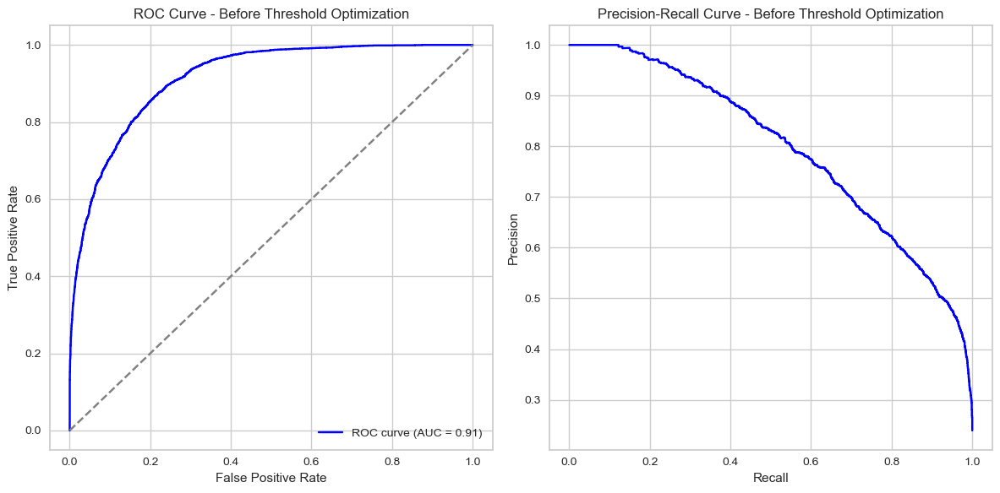

In [79]:
# Prédictions avec le meilleur modèle (avant l'optimisation du seuil)
rf_y_proba_test = rf_best_model.predict_proba(x_test)[:, 1]

# Calcul de la courbe ROC et de l'AUC
fpr, tpr, _ = roc_curve(y_test, rf_y_proba_test)
roc_auc = roc_auc_score(y_test, rf_y_proba_test)

# Calcul de la courbe Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, rf_y_proba_test)

# Affichage des courbes avant optimisation du seuil
plt.figure(figsize=(12, 6))

# Courbe ROC
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Before Threshold Optimization')
plt.legend(loc='lower right')

# Courbe Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Before Threshold Optimization')

plt.tight_layout()
plt.show()


### Optimisation du seuil de probabilité

In [80]:
# Test de différents seuils
thresholds = np.arange(0.1, 1.0, 0.01)  # Seuils à tester de 0.1 à 1
f1_scores = []

# Calculer le F1-score pour chaque seuil
for t in thresholds:
    # Appliquer le seuil à la probabilité
    y_pred_thresh = (rf_y_proba_test >= t).astype(int)
    
    # Calculer le F1-score
    f1_scores.append(f1_score(y_test, y_pred_thresh))

# Trouver le seuil optimal qui donne le meilleur F1-score
best_threshold = thresholds[np.argmax(f1_scores)]
logger.info(f"Best threshold based on F1-score: {best_threshold}")

# Appliquer le meilleur seuil pour avoir les prédictions finales
y_pred_optimal = (rf_y_proba_test >= best_threshold).astype(int)

# Évaluation avec le seuil optimal
logger.info(f"AUC (test) : {roc_auc_score(y_test, rf_y_proba_test):.3f}")
logger.info(f"F1-score (test) : {f1_score(y_test, y_pred_optimal):.3f}")
logger.info(f"Accuracy (test) : {accuracy_score(y_test, y_pred_optimal):.3f}")
logger.info(f"Classification report (test) :\n{classification_report(y_test, y_pred_optimal)}")




INFO:__main__:Best threshold based on F1-score: 0.5899999999999997
INFO:__main__:AUC (test) : 0.915
INFO:__main__:F1-score (test) : 0.703
INFO:__main__:Accuracy (test) : 0.845
INFO:__main__:Classification report (test) :
              precision    recall  f1-score   support

           0       0.92      0.87      0.89      7416
           1       0.65      0.77      0.70      2336

    accuracy                           0.84      9752
   macro avg       0.79      0.82      0.80      9752
weighted avg       0.86      0.84      0.85      9752



- Après l'optimisation du seuil de probabilité, le modèle Random Forest montre des améliorations notables, en particulier pour la classe 1 (revenu > 50k), qui est sous-représentée dans les données. L'accuracy a augmenté de 0.821 à 0.845, cependant, vu que les classes sont déséquilibrées, elle seule peut être trompeuse. Bien que l'AUC reste stable à 0.91, le F1-score passe de 0.691 à 0.703, ce qui signifie un meilleur compromis entre précision et rappel.
- pour la classe 0 (revenu ≤ 50k), bien que la précision diminue légèrement de 0.94 à 0.92, le rappel s'améliore de 0.82 à 0.87, ce qui montre une meilleure détection des instances de cette classe. Pour la classe 1 (revenu > 50k), la précision augmente de 0.59 à 0.65, tandis que le rappel baisse légèrement de 0.83 à 0.77, indiquant un modèle plus équilibré, capable d'identifier les instances positives avec une meilleure précision.

En se basant sur l'AUC et le F1-Score, on peut conclure que le modèle Random Forest présente de meilleures performances après l'optimisation des hyperparamètres et du seuil de probabilité.


In [81]:
# Stocker les résultats RF dans un dictionnaire
rf_results = {
    "Modèle": "Random Forest (optimisé + seuil)",
    "Seuil optimal": best_threshold,
    "F1-score": f1_score(y_test, y_pred_optimal),
    "AUC": roc_auc_score(y_test, rf_y_proba_test),
    "Accuracy": accuracy_score(y_test, y_pred_optimal)
}


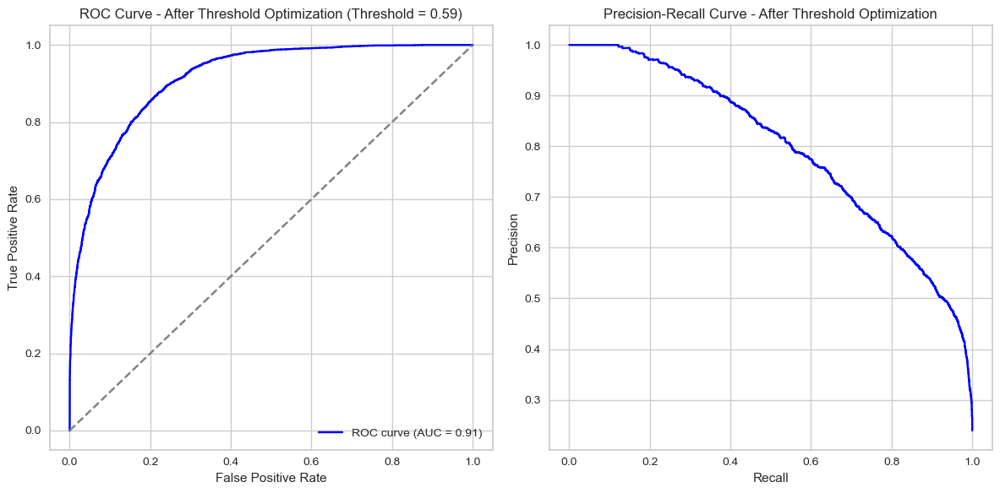

In [82]:
# Calculer les courbes ROC et Precision-Recall après l'optimisation du seuil
fpr, tpr, _ = roc_curve(y_test, rf_y_proba_test)
roc_auc = roc_auc_score(y_test, rf_y_proba_test)
precision, recall, _ = precision_recall_curve(y_test, rf_y_proba_test)

# Affichage des courbes après optimisation du seuil
plt.figure(figsize=(12, 6))

# Courbe ROC après optimisation du seuil
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve - After Threshold Optimization (Threshold = {best_threshold:.2f})')
plt.legend(loc='lower right')

# Courbe Precision-Recall après optimisation du seuil
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', label=f'Precision-Recall curve (Threshold = {best_threshold:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve - After Threshold Optimization')

plt.tight_layout()
plt.show()



En général, la courbe ROC indique une bonne performance du modèle. Avant et après l’optimisation du seuil de probabilité, elle reste proche du coin supérieur gauche, ce qui reflète un bon compromis entre le taux de vrais positifs (sensibilité) et le taux de faux positifs.

De même, la courbe Precision-Recall se situe proche du coin supérieur droit, ce qui témoigne d’un bon équilibre entre précision et rappel. Cela est particulièrement pertinent dans notre contexte de déséquilibre des classes, où la courbe PR est  plus informative que la courbe ROC.

## 1.2 XGBOOST

### Définition du pipeline

In [100]:
# Pipeline complet : prétraitement + modèle
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', XGBClassifier(
        objective='binary:logistic',
        eval_metric='logloss',
        use_label_encoder=False,
        random_state=42
    ))
])
xgb_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week', 'capital_diff'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(catego...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, ...))])

### Baseline

In [84]:
# Entraînement
xgb_pipeline.fit(x_train, y_train)

# Prédictions
y_pred = xgb_pipeline.predict(x_test)
y_proba = xgb_pipeline.predict_proba(x_test)[:, 1]

# Évaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))
print("AUC:", roc_auc_score(y_test, y_proba))
print("Classification report:\n", classification_report(y_test, y_pred))


C:\Users\Hania\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[07:13:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




Accuracy: 0.8748974569319115
F1-score: 0.7219690063810391
AUC: 0.9293150350131518
Classification report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92      7416
           1       0.77      0.68      0.72      2336

    accuracy                           0.87      9752
   macro avg       0.84      0.81      0.82      9752
weighted avg       0.87      0.87      0.87      9752



Le modèle XGBoost atteint une très bonne performance avec une accuracy de 87,5 %, une AUC de 0.93, et un F1-score de 0.72.

### Optimisation des hyperparamètres

In [85]:
# Définir la grille de paramètres avec régularisation
param_grid = {
    'model__n_estimators': [200, 250],
    'model__max_depth': [6, 8, 10],
    'model__learning_rate': [0.1, 0.2, 0.5],
    'model__min_child_weight': [1, 5, 10],
    'model__reg_lambda': [0, 0.01,1,2],
    'model__scale_pos_weight': [1, len(y_train[y_train==0]) / len(y_train[y_train==1])]  
}


cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# Définir GridSearchCV avec ces paramètres
grid_search = GridSearchCV(
    xgb_pipeline, 
    param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1, 
    verbose=2
)

# Lancer l'optimisation
grid_search.fit(x_train, y_train)

# Afficher les meilleurs paramètres
print(f"Best parameters: {grid_search.best_params_}")

# Évaluation avec les meilleurs paramètres
y_pred = grid_search.predict(x_test)
y_proba = grid_search.predict_proba(x_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))
print("AUC:", roc_auc_score(y_test, y_proba))
print("Classification report:\n", classification_report(y_test, y_pred))


Fitting 5 folds for each of 432 candidates, totalling 2160 fits


C:\Users\Hania\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[07:22:29] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




Best parameters: {'model__learning_rate': 0.1, 'model__max_depth': 6, 'model__min_child_weight': 1, 'model__n_estimators': 200, 'model__reg_lambda': 2, 'model__scale_pos_weight': 1}
Accuracy: 0.8752050861361772
F1-score: 0.7227158806106173
AUC: 0.9311356831212778
Classification report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92      7416
           1       0.77      0.68      0.72      2336

    accuracy                           0.88      9752
   macro avg       0.84      0.81      0.82      9752
weighted avg       0.87      0.88      0.87      9752



Après optimisation, on constate une legère amélioration du baseline qui est deja très performant.

### Courbe de ROC-Courbe Precision recall 

<Figure size 1200x600 with 0 Axes>

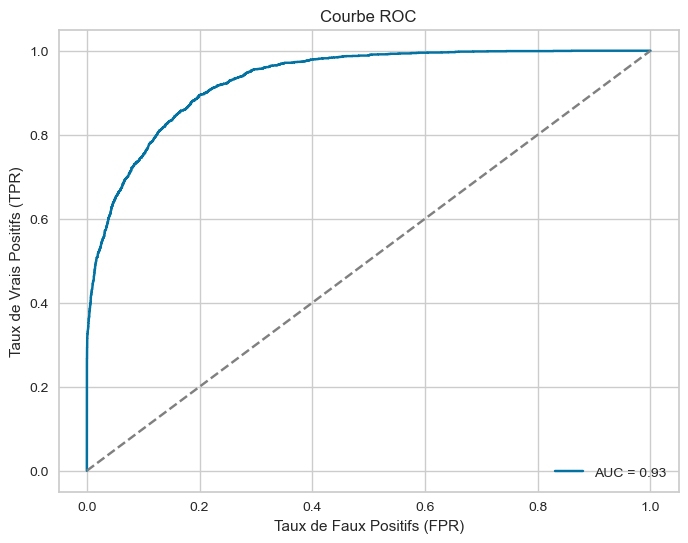

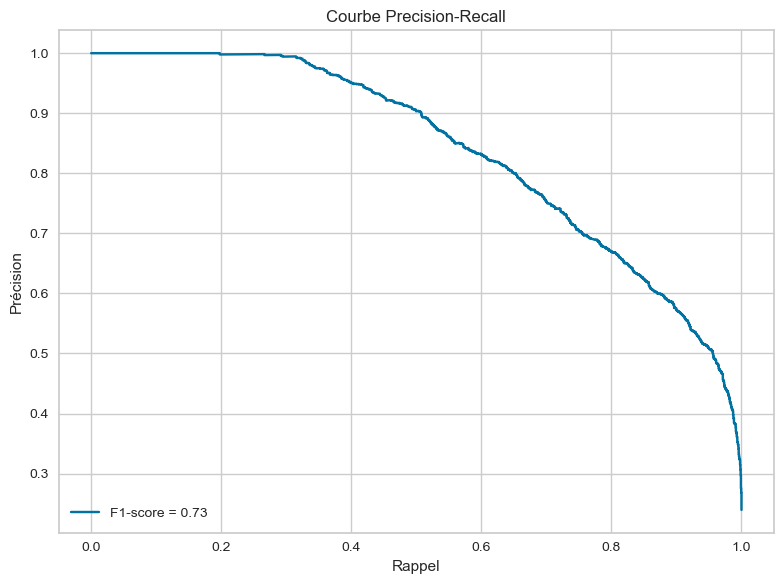

In [87]:

plt.figure(figsize=(12, 6))
# Afficher la courbe ROC pour visualiser la performance
fpr, tpr, _ = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonale (AUC = 0.5)
plt.xlabel('Taux de Faux Positifs (FPR)')
plt.ylabel('Taux de Vrais Positifs (TPR)')
plt.title('Courbe ROC')
plt.legend(loc='lower right')


# Optionnel : Afficher la courbe Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='b', label=f'F1-score = {max_f1:.2f}')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Precision-Recall')
plt.legend(loc='lower left')


plt.tight_layout()
plt.show()

### Détermination d'un seuil de probabilité optimal

In [88]:

# Récupérer les probabilités prédites sur le test set
y_scores = grid_search.predict_proba(x_test)[:, 1]

# Trouver le seuil qui maximise le F1-score
thresholds = np.linspace(0.1, 0.9, 100)
f1_scores = [f1_score(y_test, y_scores >= t) for t in thresholds]
best_threshold = thresholds[np.argmax(f1_scores)]

print(f"Seuil optimal basé sur le F1-score : {best_threshold:.3f}")



Seuil optimal basé sur le F1-score : 0.367


In [89]:
# Appliquer le seuil optimal
y_pred_opt = (y_scores >= best_threshold).astype(int)
# Évaluation finale
print("== Évaluation avec seuil optimisé ==")
print("Accuracy:", accuracy_score(y_test, y_pred_opt))
print("F1-score:", f1_score(y_test, y_pred_opt))
print("AUC:", roc_auc_score(y_test, y_scores))
print("Classification Report:\n", classification_report(y_test, y_pred_opt))


== Évaluation avec seuil optimisé ==
Accuracy: 0.8625922887612797
F1-score: 0.730815588589795
AUC: 0.9311356831212778
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.89      0.91      7416
           1       0.69      0.78      0.73      2336

    accuracy                           0.86      9752
   macro avg       0.81      0.83      0.82      9752
weighted avg       0.87      0.86      0.87      9752



L’optimisation des hyperparamètres a permis un léger gain en F1-score  et en AUC , mais les résultats globaux restent très proches de ceux du modèle de base,il en est de même pour l'optimisation du seuil de probabilité. L'AUC reste élevé et stable (~0.93), indiquant une bonne capacité globale du modèle à distinguer les classes malgré le déséquilibre. Et le f1 score est passé de 0.72 à 0.73. Le modèle est donc globalement performant.

L’ajustement du seuil de classification (à 0.36 au lieu de 0.5) a conduit à une amélioration notable du rappel (80% vs 68%), le modèle détecte davantage de cas positifs. Cette amélioration du rappel s’est faite au prix d’une baisse de la précision (66% vs 77%), un compromis qui a permis de  maximiser le F1-score.

In [90]:
# Stocker les résultats XGB dans un dictionnaire
xgb_results = {
    "Modèle": "XGBoost (optimisé + seuil)",
    "Seuil optimal": best_threshold,
    "F1-score": f1_score(y_test, y_pred_opt),
    "AUC": roc_auc_score(y_test, y_scores),
    "Accuracy": accuracy_score(y_test, y_pred_opt)
}

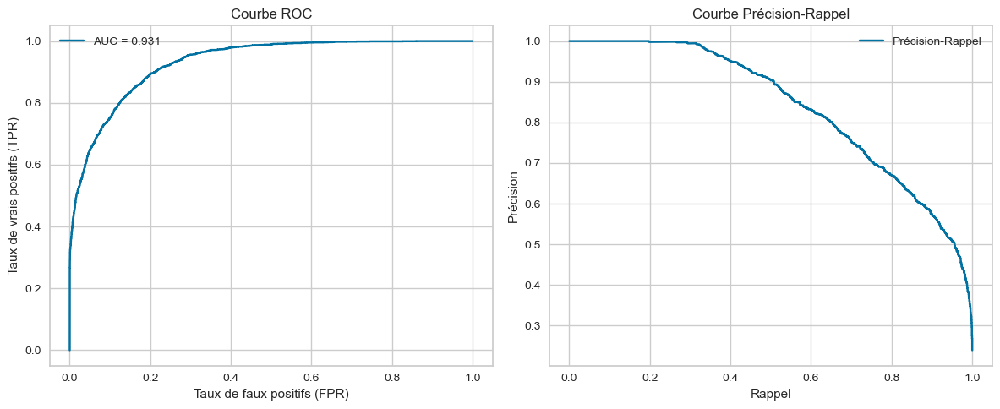

In [91]:
# Calcul des courbes
fpr, tpr, roc_thresholds = roc_curve(y_test, y_scores)
precision, recall, pr_thresholds = precision_recall_curve(y_test, y_scores)

# ROC AUC
roc_auc = auc(fpr, tpr)

# Courbe ROC
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC')
plt.legend()
plt.grid(True)

# Courbe Précision-Rappel
plt.subplot(1, 2, 2)
plt.plot(recall, precision, label='Précision-Rappel')
# Trouver le point correspondant au seuil optimal
best_idx = np.argmin(np.abs(pr_thresholds - best_threshold))
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


Que ce soit avant ou après l’ajustement du seuil de probabilité,  la courbe ROC reste proche du coin supérieur gauche, traduisant un très bon équilibre entre la sensibilité (taux de vrais positifs) et le taux de faux positifs.

La courbe Precision-Recall est également bien positionnée, proche du coin supérieur droit, indiquant  un très bon compromis  entre précision et rappel, ce qui est particulièrement important dans notre contexte.

## 2. Choix du meilleur modèle

In [92]:
# Créer un DataFrame avec les deux résultats
df_summary = pd.DataFrame([lg_results, knn_results, rf_results, xgb_results])

# Affichage
df_summary


,Modèle,Seuil optimal,F1-score,AUC,Accuracy
0,Régression Logistique (optimisé + seuil),0.610000,0.679019,0.898181,0.829471
1,KNN (optimisé + seuil),0.310000,0.674668,0.894263,0.819319
2,Random Forest (optimisé + seuil),0.590000,0.702671,0.914873,0.844750
3,XGBoost (optimisé + seuil),0.366667,0.730816,0.931136,0.862592



Parmi les quatre modèles testés (régression logistique, KNN, Random Forest et XGBoost) avec optimisation des hyperparamètres et ajustement du seuil de probabilité, **XGBoost** se distingue comme le meilleur modèle global.

- Il obtient les **meilleurs scores sur tous les indicateurs clés** 

  - Son **F1-score ** est de 0.73, ce qui montre un meilleur cmpromis entre  précision et rappel, ce qui est crucial dans notre contexte de classes déséquilibrées.
  - Son **AUC ** qui est de 0.93 montre une excellente capacité de discrimination entre les deux classes.
  - Son**Accuracy **(même si dans notre cas elle est moins pertinente car les classes sont déséquilibrées) est de 86.26 %. Il s'agit taux de bonne classification le plus élevé parmi les modèles testés.


Notre choix final porte donc sur le modèle XGBoost.


## 3. Etude de la feature importance global et local avec shap

### 3.1 Feature Importance global

Dimensions de X_processed : (39007, 47)


100%|===================| 38959/39007 [02:27<00:00]        

X_processed.shape: (39007, 47)
shap_values.shape: (39007, 47)


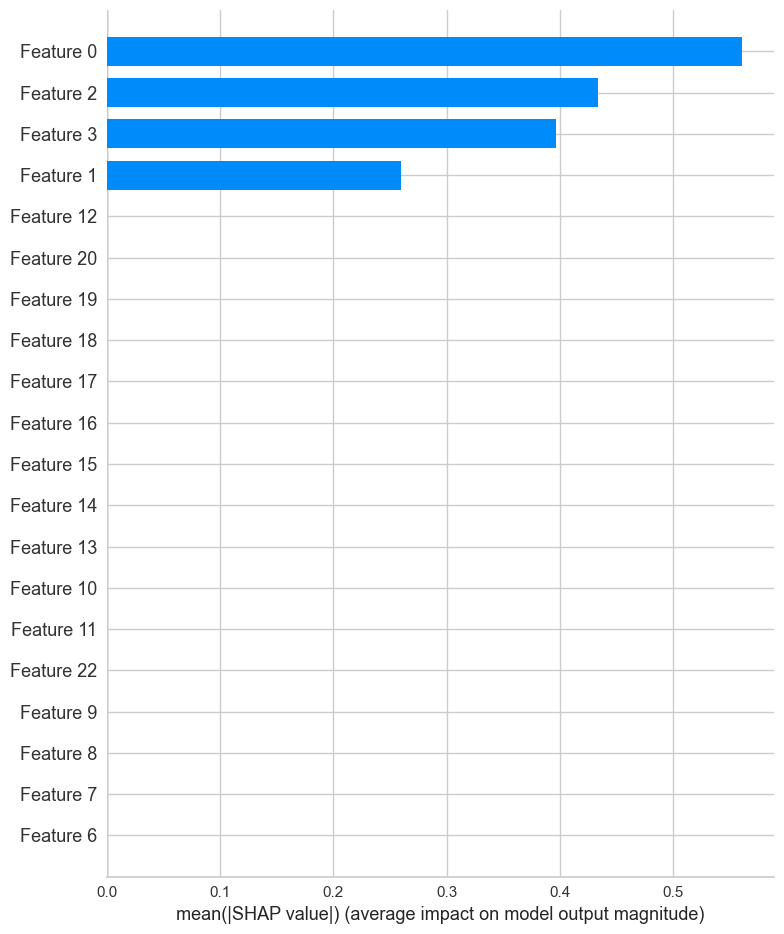

In [93]:
# Récupérer le pipeline (avec préprocesseur et modèle XGBoost optimisé)
pipeline = grid_search.best_estimator_

# Récupération du préprocesseur et du modèle
preprocessor = pipeline.named_steps['preprocessor']  # Assurez-vous que 'preprocessor' est le bon nom
xgb_model = pipeline.named_steps['model']  # Assurez-vous que 'model' est le bon nom

# Appliquer le préprocesseur aux données d'entrée (x_train)
X_processed = preprocessor.transform(x_train)

# Vérification des dimensions
print(f"Dimensions de X_processed : {X_processed.shape}")

# Si la sortie du préprocesseur est une matrice creuse (CSR), convertissons-la en dense
if isinstance(X_processed, np.ndarray):
    X_processed = X_processed
elif isinstance(X_processed, scipy.sparse.csr_matrix):
    X_processed = X_processed.toarray()  # Conversion en matrice dense

# Explainer sur les données prétraitées
explainer = shap.Explainer(xgb_model, X_processed)

# Valeurs SHAP
shap_values = explainer(X_processed)

# Vérif : les dimensions doivent être identiques
print("X_processed.shape:", X_processed.shape)
print("shap_values.shape:", shap_values.values.shape)

# Tracé OK si les dimensions correspondent
shap.summary_plot(shap_values, X_processed, plot_type="bar")

In [94]:
def get_feature_names(preprocessor):
    output_features = []

    for name, transformer, features in preprocessor.transformers_:
        if name == 'remainder' and transformer == 'drop':
            continue

        # Si c'est un Pipeline (souvent le cas), prendre son dernier step
        if isinstance(transformer, Pipeline):
            last_step = transformer.steps[-1][1]
        else:
            last_step = transformer

        # Récupérer les noms si possible
        if hasattr(last_step, 'get_feature_names_out'):
            names = last_step.get_feature_names_out(features)
        else:
            names = features  # fallback

        # Ajout des noms
        output_features.extend(names)

    return output_features

# Application
feature_names = get_feature_names(preprocessor)


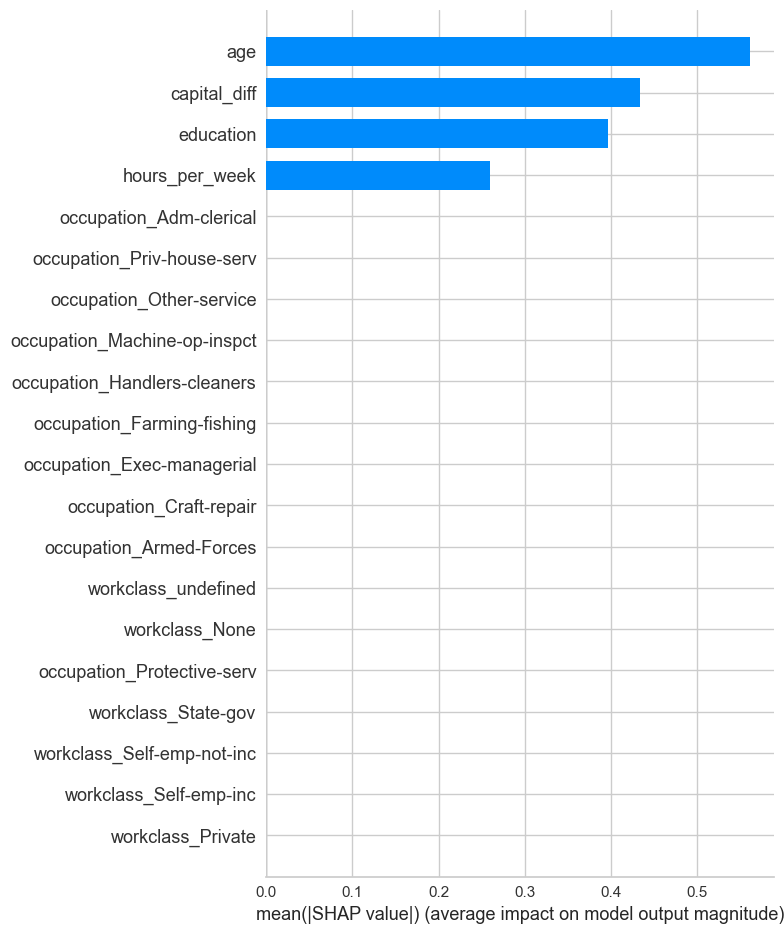

In [95]:
shap.summary_plot(shap_values, features=X_processed, feature_names=feature_names, plot_type="bar")


Le graphique ci-dessus présente les variables les plus influentes dans les prédictions du modèle, selon la moyenne des valeurs absolues de SHAP. Ce qui permet d’évaluer quelles variables contribuent le plus, en moyenne, à la décision finale du modèle, indépendamment du sens (positif ou négatif) de cette contribution.
- âge est la variable la plus déterminante en moyenne dans la classification du revenu, ce qui reflète un lien fort entre l’âge d’un individu et ses chances d’avoir un revenu supérieur ou inférieur à 50K.

- capital_diff (différence entre gains et pertes en capital) est également très influent, ce qui est logique, car un capital positif peut indiquer une situation financière favorable.

- education et hours_per_week jouent aussi un rôle important, traduisant l’impact du niveau d’études et du temps de travail sur les revenus.

À l’inverse, les autres variables catégorielles liées à l’occupation ou à la catégorie socioprofessionnelle ont un impact plus limité voire nulle dans les décisions du modèle.

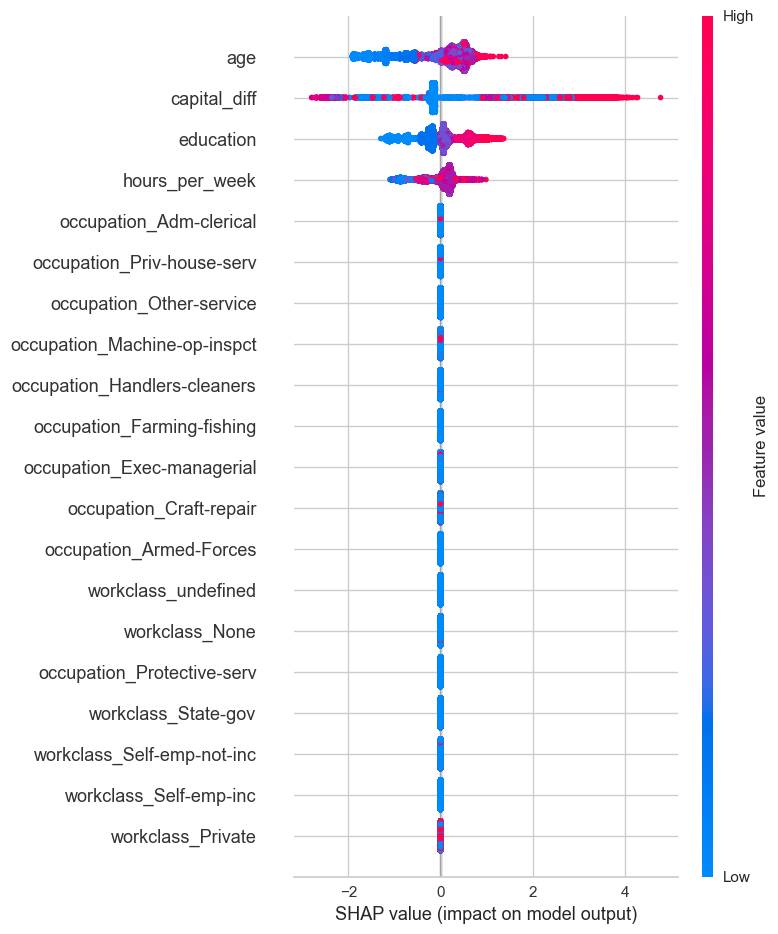

In [96]:
shap.summary_plot(shap_values, features=X_processed, feature_names=feature_names, plot_type="dot")



L’analyse globale des valeurs SHAP révèle que les variables numériques continues sont les plus déterminantes dans la prédiction des revenus élevés. En tête, la variable `capital_diff`, représentant la différence entre gains et pertes en capital, exerce l'influence la plus forte. Des valeurs élevées de cette variable augmentent significativement la probabilité d'appartenir à la classe des individus gagnant plus de 50 000 dollars.

L’âge joue également un rôle important : les individus plus âgés ont en moyenne une probabilité plus élevée d’avoir un revenu élevé, bien que son effet soit légèrement moins prononcé que celui du capital. Le niveau d’éducation est aussi un facteur déterminant ; un niveau d’études plus élevé contribue positivement à la prédiction du revenu, traduisant l’importance du capital humain dans ce modèle. Les heures travaillées par semaine ont un impact plus modéré, mais vont également dans le sens d’une augmentation du revenu.

En revanche, les autres variables catégorielles telles que `occupation` et `workclass` ont une contribution moyenne relativement faible. Elles semblent jouer un rôle secondaire, probablement utile dans des cas particuliers mais peu déterminant de manière globale.

### 3.2 Feature importance local

In [97]:
# Sélection d'une instance spécifique à analyser 
instance_index = 0  # ou tout autre indice d'observation

# Récupérer les valeurs SHAP pour l'instance spécifique
shap_values_local = shap_values[instance_index]

# Vérification des valeurs SHAP pour l'instance spécifique
print(f"Base Value: {shap_values_local.base_values}")
print(f"SHAP Values: {shap_values_local.values}")

# Initialisation de JavaScript pour la visualisation (nécessaire pour les graphiques interactifs)
shap.initjs()

# Si X_processed est un ndarray, nous devons utiliser un index simple
# Affichage de l'importance locale pour l'instance spécifiée
shap.force_plot(
    shap_values_local.base_values,  # Base value (valeur prédite avant les contributions des features)
    shap_values_local.values,       # SHAP values (impact de chaque feature sur la prédiction)
    X_processed[instance_index],    # Accès à l'instance avec un index simple (si X_processed est un ndarray)
    feature_names=feature_names    # Noms des features
)


Base Value: 0.42495084394669047
SHAP Values: [ 0.15605169 -0.19099388 -0.14273746  0.69600852  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.        ]


Nous choisissons d'étudier les contributions des variables dans la classification de l'individu 0.
Le modèle prédit avec une forte probabilité (94%) que cet individu a un revenu supérieur à 50K, malgré une valeur de base de 0.425 représentant la moyenne des prédictions sur l’ensemble des données.

- Âge : impact négatif majeur (−0.2624) – réduit fortement la probabilité de revenu élevé.

- Différence de capital : impact négatif modéré (−0.1314).

- Heures travaillées par semaine : impact légèrement positif (+0.0079).

Éducation : aucune influence (0.0).

Malgré ces contributions négatives visibles, la prédiction finale reste très positive, ce qui suggère que d’autres variables, non représentées dans la visualisation, ont un effet fortement positif sur la prédiction.


## 4. Enregistrement au format .dill

In [106]:
# 4. Enregistrer le modèle et le seuil optimisé

# Enregistrer le modèle
with open('optimized_model.dill', 'wb') as f:
    dill.dump(grid_search.best_estimator_, f)

# Enregistrer le seuil optimal
with open('optimal_threshold.dill', 'wb') as f:
    dill.dump(best_threshold, f)

print("Modèle et seuil optimisé enregistrés.")

Modèle et seuil optimisé enregistrés.
